<a href="https://colab.research.google.com/github/imanf18/miniproject2_imanF_sementara/blob/main/Miniproject2_skin_cancer_Ham10000.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Importing the essential libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
import random
print(f'TensorFlow version: {tf.__version__}')
print(f'\nAccessible devices: \n{(tf.config.list_physical_devices())}')

TensorFlow version: 2.15.0

Accessible devices: 
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


#Check GPU & its compute capability

In [3]:
!nvidia-smi

Sat May 18 10:09:37 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              11W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
print(f'is GPU built with cuda: {tf.test.is_built_with_cuda()}')
print(f'is compute capability at least 7.0: {tf.test.is_gpu_available(True, (7,0))}')

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


is GPU built with cuda: True
is compute capability at least 7.0: True


In [5]:
#You can see the disk information using a command like !df -h.
#To see CPU specs, !cat /proc/cpuinfo
!cat /proc/cpuinfo
#For memory, !cat /proc/meminfo.
!cat /proc/meminfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 85
model name	: Intel(R) Xeon(R) CPU @ 2.00GHz
stepping	: 3
microcode	: 0xffffffff
cpu MHz		: 2000.146
cache size	: 39424 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm mpx avx512f avx512dq rdseed adx smap clflushopt clwb avx512cd avx512bw avx512vl xsaveopt xsavec xgetbv1 xsaves arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmi

In [6]:
pip install scikit-learn

In [7]:
# Get helper functions file
import os

if not os.path.exists("helper_functions.py"):
    !wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
else:
    print("[INFO] 'helper_functions.py' already exists, skipping download.")

--2024-05-18 10:10:03--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2024-05-18 10:10:03 (20.5 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [8]:
# Import series of helper functions for the notebook (we've created/used these in previous notebooks)
from helper_functions import create_tensorboard_callback, plot_loss_curves, compare_historys, load_and_prep_image

#Downloading ham10000 dataset using kaggle API

In [9]:
# First go to your Kaggle account and create New API Token, a kaggle.json file will be download.

# Make sure you have a kaggle.json file.
!ls -lha kaggle.json

!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json

# You must change "kmader/skin-cancer-mnist-ham10000" with the dataset you want.
# You can use copy API command from kaggle to be sure
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000

# Unzip data in Google Colab
!unzip -q /content/skin-cancer-mnist-ham10000.zip -d dataset

# Unzip data in Google Drive
#!unzip -q /content/skin-cancer-mnist-ham10000.zip -d '/content/gdrive/My Drive/ML data'

-rw-r--r-- 1 root root 66 May 18 10:10 kaggle.json
kaggle.json
Dataset URL: https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000
License(s): CC-BY-NC-SA-4.0
100% 5.19G/5.20G [01:01<00:00, 199MB/s]
100% 5.20G/5.20G [01:01<00:00, 90.8MB/s]


#What is in the Kaggle skin-cancer-mnist-ham10000 data?
the *skin-cancer-mnist-ham10000.zip* file downled from kaggle contains HAM10000_images_part_1 with 5000 unlabled (450, 600, 3)images, HAM10000_images_part_2 with 5015 unlabled (450, 600, 3)images and a HAM10000_metadata csv file witch contains diagnosis for each image file in these two floders.
<br>***here you can see HAM10000_metadata.csv:***</br>







In [10]:
x=pd.read_csv("/content/dataset/HAM10000_metadata.csv")
x.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [11]:
n=np.asarray(x)
n=n[:,1:3]
n[:,0]=n[:,0]+'.jpg'
print(n.shape)
print(n[0])

(10015, 2)
['ISIC_0027419.jpg' 'bkl']


#labeling the images
TensorFlow APIs like tf.keras.preprocessing.image_dataset_from_directory or tensorflow.keras.preprocessing.image.ImageDataGenerator are commonly used to Generate batches of tensor image data with real-time data augmentation and these batches contain both image tenseros and one hot encoded lables together in a tuple.

> 🔑note: when you are going to fit the model by Train_Data Generated with ImageDataGenerator API as both image tenseros and lables are together in a tuple and Train_Data=(X_train, y_train), therefore model.fit(Train_Data,...) is used instead of model.fit(X=train_images,y=train_labels,...)

<br>ImageDataGenerator and image_dataset_from_directory APIs needs images of different classes to be in different folders and they label them based on alphabetic order of the each class folder.</br>
<br>***here we are going to move each image to its class folder:***</br>



In [12]:
all_images_dir='/content/ham10000'
os.mkdir(all_images_dir)

In [13]:
train_images_dir='/content/ham10000/train'
os.mkdir(train_images_dir)

In [14]:
train_images_dir='/content/ham10000/train/vasc'
os.mkdir(train_images_dir)
train_images_dir='/content/ham10000/train/bkl'
os.mkdir(train_images_dir)
train_images_dir='/content/ham10000/train/df'
os.mkdir(train_images_dir)
train_images_dir='/content/ham10000/train/bcc'
os.mkdir(train_images_dir)
train_images_dir='/content/ham10000/train/akiec'
os.mkdir(train_images_dir)
train_images_dir='/content/ham10000/train/mel'
os.mkdir(train_images_dir)
train_images_dir='/content/ham10000/train/nv'
os.mkdir(train_images_dir)

In [15]:
test_images_dir='/content/ham10000/test'
os.mkdir(test_images_dir)

In [16]:
test_images_dir='/content/ham10000/test/vasc'
os.mkdir(test_images_dir)
test_images_dir='/content/ham10000/test/bkl'
os.mkdir(test_images_dir)
test_images_dir='/content/ham10000/test/df'
os.mkdir(test_images_dir)
test_images_dir='/content/ham10000/test/bcc'
os.mkdir(test_images_dir)
test_images_dir='/content/ham10000/test/akiec'
os.mkdir(test_images_dir)
test_images_dir='/content/ham10000/test/mel'
os.mkdir(test_images_dir)
test_images_dir='/content/ham10000/test/nv'
os.mkdir(test_images_dir)

In [17]:
import shutil
i=0

for file_name in os.listdir('/content/dataset/HAM10000_images_part_1'):
    if file_name[0] in ['I']:

        if file_name in  n[:,0]:

            print(file_name)
            i=i+1
            result = np.where(n[:,0] == file_name)

            print(file_name)
            result=result[0][0]

            pos=int(result)
            pos=n[pos,1]
            print(pos)

            current0='/content/dataset/HAM10000_images_part_1/'+file_name
            direc0='/content/ham10000/train/'+pos+'/'+file_name
                #print (im)
            shutil.move(current0,direc0 )
print(i)

Streaming output truncated to the last 5000 lines.
nv
ISIC_0028625.jpg
ISIC_0028625.jpg
nv
ISIC_0027568.jpg
ISIC_0027568.jpg
nv
ISIC_0027046.jpg
ISIC_0027046.jpg
bcc
ISIC_0028928.jpg
ISIC_0028928.jpg
bcc
ISIC_0025870.jpg
ISIC_0025870.jpg
nv
ISIC_0025359.jpg
ISIC_0025359.jpg
nv
ISIC_0024527.jpg
ISIC_0024527.jpg
nv
ISIC_0025355.jpg
ISIC_0025355.jpg
nv
ISIC_0025707.jpg
ISIC_0025707.jpg
vasc
ISIC_0026255.jpg
ISIC_0026255.jpg
nv
ISIC_0026584.jpg
ISIC_0026584.jpg
nv
ISIC_0028250.jpg
ISIC_0028250.jpg
nv
ISIC_0025242.jpg
ISIC_0025242.jpg
nv
ISIC_0027630.jpg
ISIC_0027630.jpg
nv
ISIC_0028131.jpg
ISIC_0028131.jpg
nv
ISIC_0027432.jpg
ISIC_0027432.jpg
nv
ISIC_0025577.jpg
ISIC_0025577.jpg
akiec
ISIC_0025489.jpg
ISIC_0025489.jpg
mel
ISIC_0027514.jpg
ISIC_0027514.jpg
nv
ISIC_0027888.jpg
ISIC_0027888.jpg
vasc
ISIC_0027956.jpg
ISIC_0027956.jpg
mel
ISIC_0027782.jpg
ISIC_0027782.jpg
nv
ISIC_0025968.jpg
ISIC_0025968.jpg
nv
ISIC_0024674.jpg
ISIC_0024674.jpg
nv
ISIC_0027135.jpg
ISIC_0027135.jpg
bcc
ISIC_0028

In [18]:
import shutil
i=0

for file_name in os.listdir('/content/dataset/HAM10000_images_part_2'):
    if file_name[0] in ['I']:

        if file_name in  n[:,0]:

            print(file_name)
            i=i+1
            result = np.where(n[:,0] == file_name)

            print(file_name)
            result=result[0][0]

            pos=int(result)
            pos=n[pos,1]
            print(pos)

            current0='/content/dataset/HAM10000_images_part_2/'+file_name
            direc0='/content/ham10000/train/'+pos+'/'+file_name
                #print (im)
            shutil.move(current0,direc0 )
print(i)

Streaming output truncated to the last 5000 lines.
nv
ISIC_0031134.jpg
ISIC_0031134.jpg
nv
ISIC_0031071.jpg
ISIC_0031071.jpg
nv
ISIC_0032545.jpg
ISIC_0032545.jpg
vasc
ISIC_0031097.jpg
ISIC_0031097.jpg
nv
ISIC_0029752.jpg
ISIC_0029752.jpg
nv
ISIC_0033669.jpg
ISIC_0033669.jpg
nv
ISIC_0031164.jpg
ISIC_0031164.jpg
nv
ISIC_0033319.jpg
ISIC_0033319.jpg
nv
ISIC_0033496.jpg
ISIC_0033496.jpg
mel
ISIC_0029386.jpg
ISIC_0029386.jpg
nv
ISIC_0032703.jpg
ISIC_0032703.jpg
nv
ISIC_0032657.jpg
ISIC_0032657.jpg
nv
ISIC_0032676.jpg
ISIC_0032676.jpg
nv
ISIC_0033232.jpg
ISIC_0033232.jpg
mel
ISIC_0032027.jpg
ISIC_0032027.jpg
nv
ISIC_0034074.jpg
ISIC_0034074.jpg
mel
ISIC_0029743.jpg
ISIC_0029743.jpg
nv
ISIC_0030721.jpg
ISIC_0030721.jpg
bkl
ISIC_0032835.jpg
ISIC_0032835.jpg
bkl
ISIC_0033416.jpg
ISIC_0033416.jpg
mel
ISIC_0032595.jpg
ISIC_0032595.jpg
nv
ISIC_0033385.jpg
ISIC_0033385.jpg
nv
ISIC_0033806.jpg
ISIC_0033806.jpg
mel
ISIC_0034240.jpg
ISIC_0034240.jpg
nv
ISIC_0030745.jpg
ISIC_0030745.jpg
nv
ISIC_0031420

so as you see in the block below, from total 1015 images:

0.   327 images belonges to class akiec
1.   514 images belonges to class bcc
2.   1099 images belonges to class bkl
3.   115 images belonges to class df
4.   1113 images belonges to class mel
5.   6705 images belonges to class nv
6.   142 images belonges to class vasc

<br>***Now we need to split these images to Train and Test sets:***</br>




In [19]:
class_names=sorted(os.listdir('/content/ham10000/train'))
for classes in class_names:
  print(f'number of images in class {classes} =',len(os.listdir('/content/ham10000/train/'+classes)))

number of images in class akiec = 327
number of images in class bcc = 514
number of images in class bkl = 1099
number of images in class df = 115
number of images in class mel = 1113
number of images in class nv = 6705
number of images in class vasc = 142


In [20]:
i=0

for file_name in os.listdir('/content/ham10000/train'):



      if file_name in  n[:,1]:
        i=0
        m=[]
        direc=os.listdir('/content/ham10000/train/'+file_name)
        for j in range(int(.2*len(os.listdir('/content/ham10000/train/'+file_name)))):
          a=direc[j]
          direc.remove(a)
          m.append(a)
          i+=1
        for im in m:
          current0='/content/ham10000/train/'+file_name+'/'+im
          direc0=  '/content/ham10000/test/'+file_name+'/'+im
          shutil.move(current0,direc0)
          print(im,'is moved to test in class=',file_name)
        print(i)

ISIC_0033762.jpg is moved to test in class= vasc
ISIC_0030104.jpg is moved to test in class= vasc
ISIC_0033450.jpg is moved to test in class= vasc
ISIC_0033158.jpg is moved to test in class= vasc
ISIC_0026393.jpg is moved to test in class= vasc
ISIC_0024475.jpg is moved to test in class= vasc
ISIC_0032240.jpg is moved to test in class= vasc
ISIC_0024402.jpg is moved to test in class= vasc
ISIC_0031759.jpg is moved to test in class= vasc
ISIC_0031648.jpg is moved to test in class= vasc
ISIC_0026336.jpg is moved to test in class= vasc
ISIC_0024904.jpg is moved to test in class= vasc
ISIC_0024867.jpg is moved to test in class= vasc
ISIC_0031955.jpg is moved to test in class= vasc
ISIC_0032270.jpg is moved to test in class= vasc
ISIC_0025425.jpg is moved to test in class= vasc
ISIC_0033092.jpg is moved to test in class= vasc
ISIC_0028188.jpg is moved to test in class= vasc
ISIC_0032715.jpg is moved to test in class= vasc
ISIC_0028431.jpg is moved to test in class= vasc
ISIC_0028406.jpg is 

#number of images in each class for test and train datasets

In [21]:
for classes in class_names:
  print(f'number of images in class {classes} of train set =',len(os.listdir('/content/ham10000/train/'+classes)))

number of images in class akiec of train set = 262
number of images in class bcc of train set = 412
number of images in class bkl of train set = 880
number of images in class df of train set = 92
number of images in class mel of train set = 891
number of images in class nv of train set = 5364
number of images in class vasc of train set = 114


In [22]:
for classes in class_names:
  print(f'number of images in class {classes} of test set =',len(os.listdir('/content/ham10000/test/'+classes)))

number of images in class akiec of test set = 65
number of images in class bcc of test set = 102
number of images in class bkl of test set = 219
number of images in class df of test set = 23
number of images in class mel of test set = 222
number of images in class nv of test set = 1341
number of images in class vasc of test set = 28


In [23]:
# Import the required modules for model creation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, BatchNormalization, Dropout, Dense, MaxPool2D
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras import layers
import datetime

#making functions to systematicly create,compile,fit,save and ploting models:

In [72]:
def prepare_for_train_test(train_dir= '/content/ham10000/train',
                           test_dir= '/content/ham10000/test',
                           IMG_SIZE = (300, 400),
                           data_aug=False):
    if data_aug==False:
      print('no data augmentaion on train data....')
      train_datagen = ImageDataGenerator()
    if data_aug:
      print('using data augmentaion on train data....')
      train_datagen = ImageDataGenerator( rotation_range = 10,
                                          width_shift_range = 0.2,
                                          height_shift_range = 0.2,
                                          shear_range = 0.2,
                                          horizontal_flip = True,
                                          vertical_flip = True,
                                          fill_mode = 'nearest')
    train_data = train_datagen.flow_from_directory(directory=train_dir,
                                                   class_mode="categorical",
                                                   target_size=IMG_SIZE,
                                                   shuffle=False)

    test_datagen = ImageDataGenerator()
    test_data = test_datagen.flow_from_directory(directory=test_dir,
                                              class_mode="categorical",
                                              target_size=IMG_SIZE,
                                              shuffle=False) # don't shuffle test data for prediction analysis



    return train_data, test_data

In [73]:
transfer_model= 'EfficientNetB5'
exec('base_model = tf.keras.applications.'+transfer_model+'(include_top=False)')
base_model.trainable = False
def create_model(img_shape=(300,400), num_class=7):

    # Setup model architecture with trainable top layers
    inputs = layers.Input(shape=img_shape+(3,), name="input_layer") # shape of input image
    x = inputs
    x = base_model(x, training=False) # put the base model in inference mode so we can use it to extract features without updating the weights
    x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x) # pool the outputs of the base model
    outputs = layers.Dense(num_class, activation="softmax", name="output_layer")(x) # same number of outputs as classes
    model = tf.keras.Model(inputs, outputs)

    model.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(), # use Adam with default settings
              metrics=["accuracy"])
    print(model.summary())
    return model;

In [74]:
def train_model(model, train_data, EPOCHS=5, experiment_name="efficientnetB0", directory='/content/drive/MyDrive/models/ham1000', fine_tune=False):
    early_stop = EarlyStopping(monitor='val_loss', patience=3, verbose=1,
                           mode='auto')

    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2,
                              verbose=1, mode='auto')
    # Create checkpoint callback to save model for later use
    checkpoint_path = "best_model"+experiment_name+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                            save_weights_only=True, # save only the model weights
                                                            monitor="val_accuracy", # save the model weights which score the best validation accuracy
                                                            save_best_only=True) # only keep the best model weights on file (delete the rest)

    if fine_tune==False:
      history = model.fit(train_data,
                          validation_data=test_data,
                          validation_steps= len(test_data),
                          epochs = EPOCHS,
                          callbacks = [reduce_lr,
                                      early_stop,
                                      create_tensorboard_callback(dir_name="/content/drive/MyDrive/tensor board log/ham10000_effi",experiment_name=experiment_name),
                                      checkpoint_callback])
    if fine_tune:
      history = model.fit(train_data,
                          validation_data=test_data,
                          validation_steps= len(test_data),
                          epochs = EPOCHS*2,
                          initial_epoch= EPOCHS-1,
                          callbacks = [reduce_lr,
                                      early_stop,
                                      create_tensorboard_callback(dir_name="/content/drive/MyDrive/tensor board log/ham10000_effi",experiment_name=experiment_name),
                                      checkpoint_callback],)
    #os.mkdir(directory+'/'+experiment_name)
    #model.save(directory+'/'+experiment_name+'/'+datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return history


In [75]:
def unfreeze(model, num_layers=10):
  """
  unfreeze top layers of the functional models to prepare them for fine tuning

  Parameters
  ----------
  model: tf.model obj
  num_layers(int): number of top layers of the base model to set them trainable.
  """
  # Unfreeze all of the layers in the base model
  base_model.trainable = True

  # Refreeze every layer except for the last 10
  for layer in base_model.layers[:-(num_layers)]:
    layer.trainable = False
  model.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=.0001), # use Adam with default settings
                metrics=["accuracy"])
  print(model.summary())

#prepare for train_test data

In [76]:
train_data, test_data = prepare_for_train_test(train_dir= '/content/ham10000/train',
                           test_dir= '/content/ham10000/test',
                           IMG_SIZE = (240, 240),
                           data_aug=False)
train_data_aug, test_data_aug = prepare_for_train_test(train_dir= '/content/ham10000/train',
                           test_dir= '/content/ham10000/test',
                           IMG_SIZE = (240, 240),
                           data_aug=True)

no data augmentaion on train data....
Found 8015 images belonging to 7 classes.
Found 2000 images belonging to 7 classes.
using data augmentaion on train data....
Found 8015 images belonging to 7 classes.
Found 2000 images belonging to 7 classes.


#How does our train data looks like:

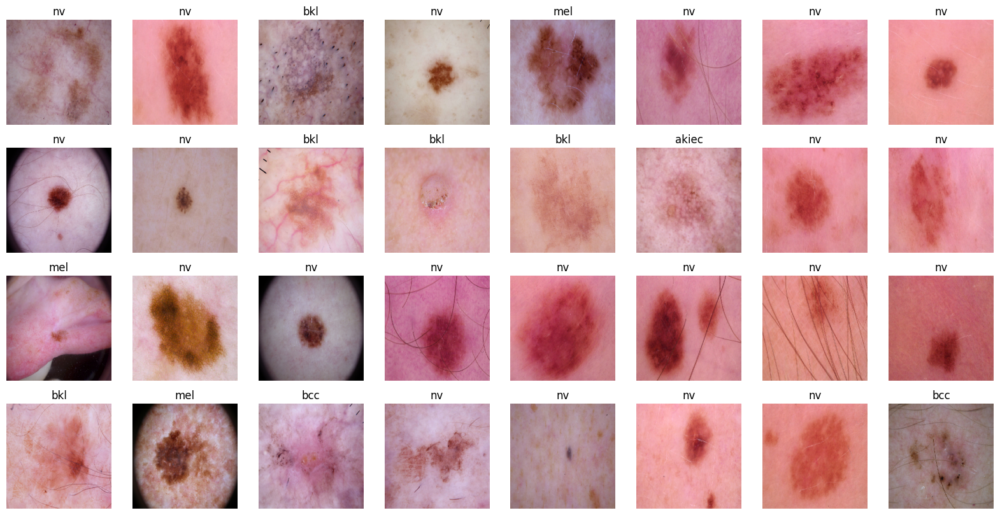

In [29]:

plt.figure(figsize=(20, 10))
for i in range(32):
  batch_num=random.randint(0,250)
  image_num=random.randint(0,31)
  plt.subplot(4, 8, i+1)
  plt.title(class_names[train_data[batch_num][1][image_num].argmax()])
  plt.imshow(train_data[batch_num][0][image_num]/255.);
  plt.axis(False)
plt.show()

And this is how augmented images looks like:

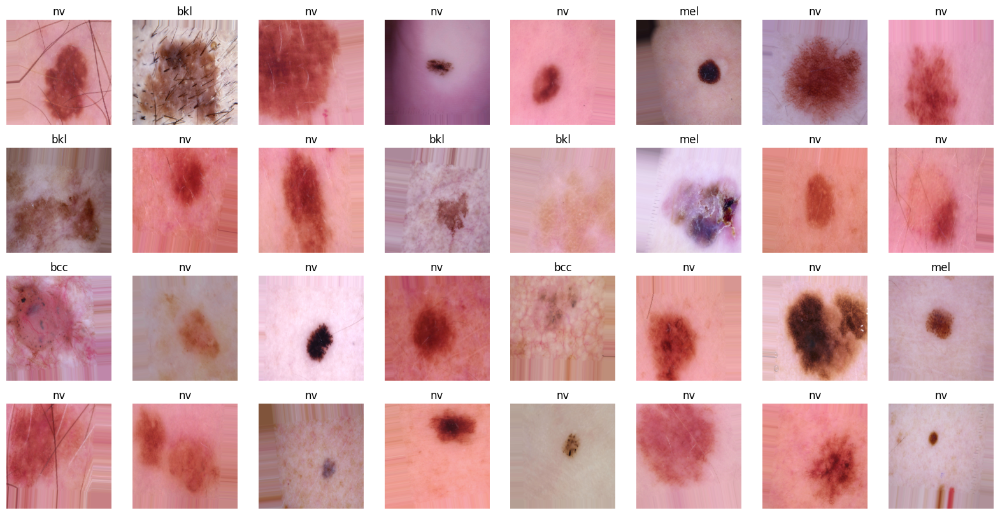

In [30]:
plt.figure(figsize=(20, 10))
for i in range(32):
  batch_num=random.randint(0,250)
  image_num=random.randint(0,31)
  plt.subplot(4, 8, i+1)
  plt.title(class_names[train_data_aug[batch_num][1][image_num].argmax()])
  plt.imshow(train_data_aug[batch_num][0][image_num]/255.);
  plt.axis(False)
plt.show()

In [31]:
def viso(data,dimention ):
  for i in range(dimention):
    a= data[dimention*i]
    for j in range (1,dimention):
      a=tf.concat([a, data[dimention*i+j]],1)
    if i ==0:img=a
    else:
      img= tf.concat([img,a],0)
  import plotly.express as px
  fig=px.imshow(img)
  fig.update_xaxes(visible=False)
  fig.update_yaxes(visible=False)
  fig.show()
  return img

In [32]:
def vis(data,dimention ):
  for i in range(dimention):
    a= data[dimention*i]
    for j in range (1,dimention):
      a=tf.concat([a, data[dimention*i+j]],1)
    if i ==0:img=a
    else:
      img= tf.concat([img,a],0)
  return img[tf.newaxis,...]

In [33]:
a=vis(train_data[100][0],3)

In [34]:
viso(train_data_aug[100][0],3)

<tf.Tensor: shape=(720, 720, 3), dtype=float32, numpy=
array([[[235.46634 , 161.46634 , 179.08812 ],
        [241.22049 , 167.0735  , 192.44098 ],
        [243.93073 , 168.      , 197.37656 ],
        ...,
        [195.61403 , 116.61404 , 110.38596 ],
        [195.53708 , 116.53708 , 110.46292 ],
        [195.46011 , 116.46012 , 110.53988 ]],

       [[235.04773 , 161.04773 , 178.175   ],
        [240.8792  , 166.8792  , 191.71811 ],
        [243.92693 , 167.97565 , 197.85384 ],
        ...,
        [195.38292 , 116.765854, 109.85122 ],
        [195.45988 , 116.91977 , 109.62035 ],
        [195.53683 , 117.07368 , 109.38948 ]],

       [[235.32863 , 161.32863 , 179.20496 ],
        [240.3174  , 166.3174  , 190.40727 ],
        [243.64603 , 167.882   , 197.29205 ],
        ...,
        [194.86034 , 116.860344, 106.860344],
        [194.62947 , 116.62947 , 106.62947 ],
        [194.3986  , 116.3986  , 106.3986  ]],

       ...,

       [[219.      , 133.      , 142.      ],
        [219.

In [35]:
!pip install av

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 42.6 MB/s eta 0:00:00


In [36]:
import torchvision
for i in range(600-67):
  b=vis(train_data_aug[100][0],3)
  a=tf.concat([a,b],axis=0)
torchvision.io.write_video('image_aug.mp4', a.numpy(),10)

In [37]:
a.shape

TensorShape([534, 720, 720, 3])

#EfficientNetB1

In [77]:
transfer_model= 'EfficientNetB1'
exec('base_model = tf.keras.applications.'+transfer_model+'(include_top=False)')
base_model.trainable = False
model_b1= create_model(img_shape=(300,400), num_class=7)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 300, 400, 3)]     0         
                                                                 
 efficientnetb1 (Functional  (None, None, None, 1280   6575239   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 7)                 8967      
                                                                 
Total params: 6584206 (25.12 MB)
Trainable params: 8967 (35.03 KB)
Non-trainable params: 6575239 (25.08 MB)
_________________________________________________________________
None


Saving TensorBoard log files to: /content/drive/MyDrive/tensor board log/ham10000_effi/efficientnetB1/20240518-120617
Epoch 1/5
251/251 [==============================] - 125s 452ms/step - loss: 1.0247 - accuracy: 0.6639 - val_loss: 0.8135 - val_accuracy: 0.7025 - lr: 0.0010
Epoch 2/5
251/251 [==============================] - 102s 404ms/step - loss: 0.8271 - accuracy: 0.7058 - val_loss: 0.7686 - val_accuracy: 0.7255 - lr: 0.0010
Epoch 3/5
251/251 [==============================] - 105s 418ms/step - loss: 0.7162 - accuracy: 0.7400 - val_loss: 0.7759 - val_accuracy: 0.7140 - lr: 0.0010
Epoch 4/5
251/251 [==============================] - 106s 422ms/step - loss: 0.7035 - accuracy: 0.7340 - val_loss: 0.6737 - val_accuracy: 0.7585 - lr: 0.0010
Epoch 5/5
251/251 [==============================] - 99s 393ms/step - loss: 0.6527 - accuracy: 0.7609 - val_loss: 0.7893 - val_accuracy: 0.7175 - lr: 0.0010


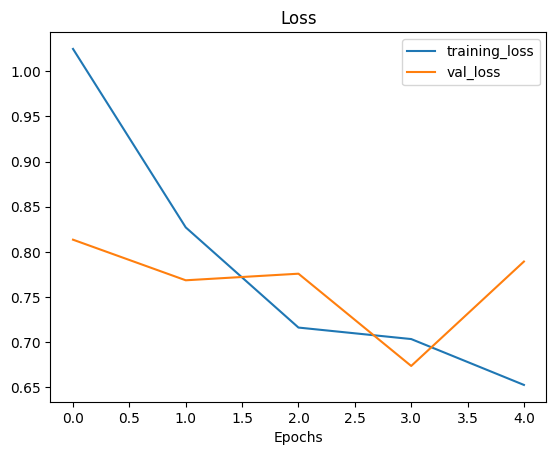

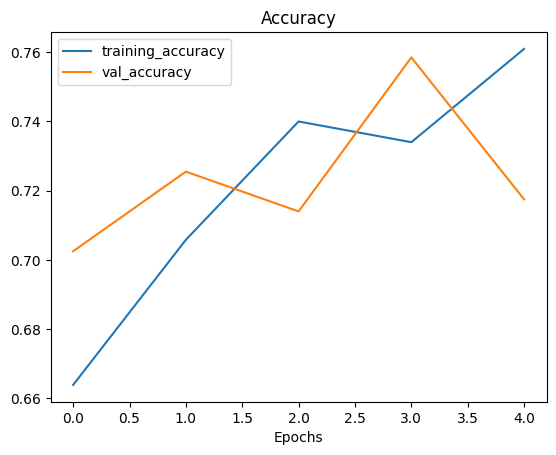

In [78]:
history_b1= train_model(model_b1, train_data, experiment_name="efficientnetB1", EPOCHS=5)
plot_loss_curves(history_b1)

In [79]:
unfreeze(model_b1, num_layers=10)

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 300, 400, 3)]     0         
                                                                 
 efficientnetb1 (Functional  (None, None, None, 1280   6575239   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 7)                 8967      
                                                                 
Total params: 6584206 (25.12 MB)
Trainable params: 1345367 (5.13 MB)
Non-trainable params: 5238839 (19.98 MB)
_________________________________________________________________
None


Saving TensorBoard log files to: /content/drive/MyDrive/tensor board log/ham10000_effi/efficientnetB1_finetune/20240518-121727
Epoch 5/10
251/251 [==============================] - 112s 396ms/step - loss: 0.6737 - accuracy: 0.7496 - val_loss: 0.6176 - val_accuracy: 0.7685 - lr: 1.0000e-04
Epoch 6/10
251/251 [==============================] - 98s 392ms/step - loss: 0.5870 - accuracy: 0.7863 - val_loss: 0.6114 - val_accuracy: 0.7680 - lr: 1.0000e-04
Epoch 7/10
251/251 [==============================] - 99s 396ms/step - loss: 0.5773 - accuracy: 0.7869 - val_loss: 0.5755 - val_accuracy: 0.7945 - lr: 1.0000e-04
Epoch 8/10
251/251 [==============================] - 117s 468ms/step - loss: 0.5383 - accuracy: 0.8029 - val_loss: 0.5944 - val_accuracy: 0.7805 - lr: 1.0000e-04
Epoch 9/10
251/251 [==============================] - ETA: 0s - loss: 0.5011 - accuracy: 0.8182
Epoch 9: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
251/251 [==============================] - 117s 468

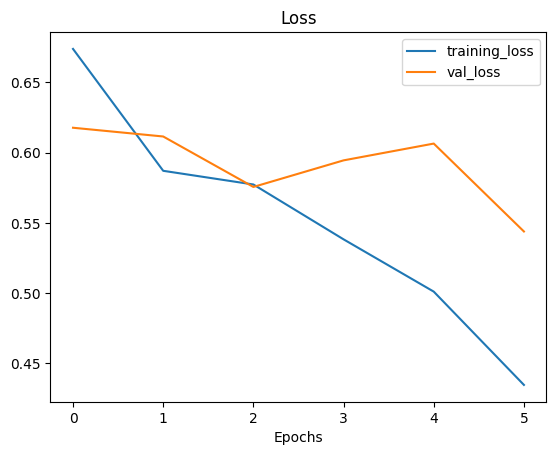

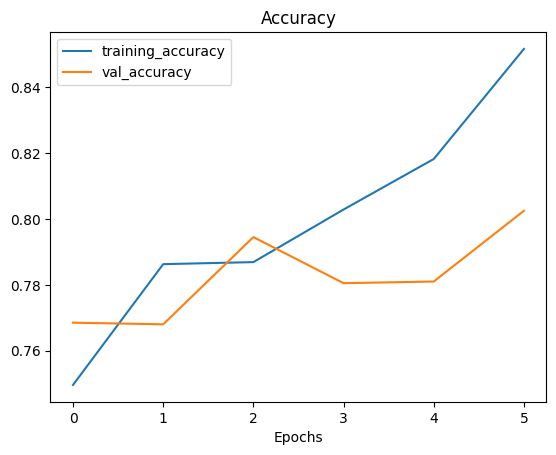

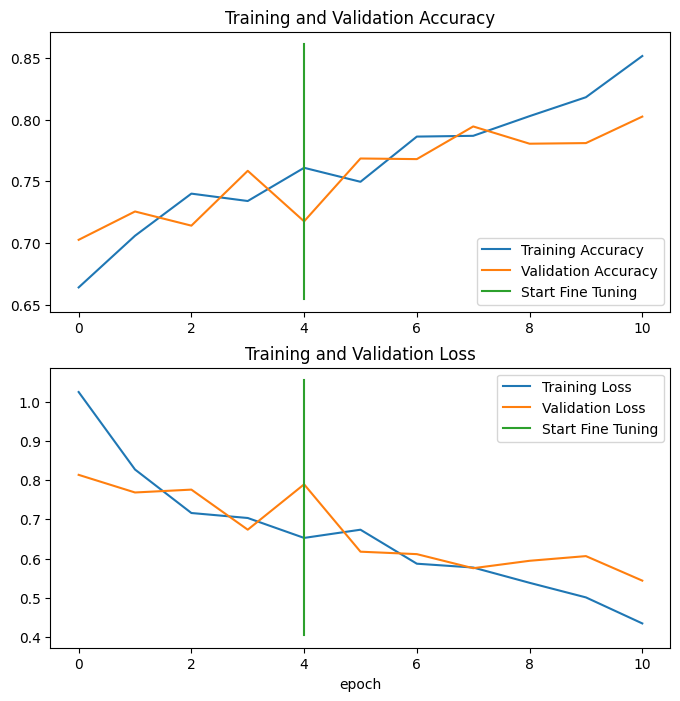

In [80]:
history_b1_finetune= train_model(model_b1, train_data, experiment_name="efficientnetB1_finetune", EPOCHS=5, fine_tune=True)
plot_loss_curves(history_b1_finetune)
compare_historys(history_b1,
                 history_b1_finetune,
                 initial_epochs=5)

In [81]:
transfer_model= 'EfficientNetB1'
exec('base_model = tf.keras.applications.'+transfer_model+'(include_top=False)')
base_model.trainable = False
model_b01_aug= create_model(img_shape=(300,400), num_class=7)

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 300, 400, 3)]     0         
                                                                 
 efficientnetb1 (Functional  (None, None, None, 1280   6575239   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 7)                 8967      
                                                                 
Total params: 6584206 (25.12 MB)
Trainable params: 8967 (35.03 KB)
Non-trainable params: 6575239 (25.08 MB)
_________________________________________________________________
None


Saving TensorBoard log files to: /content/drive/MyDrive/tensor board log/ham10000_effi/efficientnetB01_aug/20240518-123227
Epoch 1/5
251/251 [==============================] - 216s 813ms/step - loss: 1.0867 - accuracy: 0.6574 - val_loss: 0.9190 - val_accuracy: 0.6805 - lr: 0.0010
Epoch 2/5
251/251 [==============================] - 204s 814ms/step - loss: 0.8656 - accuracy: 0.6931 - val_loss: 0.8207 - val_accuracy: 0.7020 - lr: 0.0010
Epoch 3/5
251/251 [==============================] - 212s 845ms/step - loss: 0.7830 - accuracy: 0.7173 - val_loss: 0.8638 - val_accuracy: 0.7015 - lr: 0.0010
Epoch 4/5
251/251 [==============================] - 214s 852ms/step - loss: 0.7646 - accuracy: 0.7280 - val_loss: 0.7585 - val_accuracy: 0.7150 - lr: 0.0010
Epoch 5/5
251/251 [==============================] - 204s 812ms/step - loss: 0.7254 - accuracy: 0.7361 - val_loss: 0.7411 - val_accuracy: 0.7215 - lr: 0.0010


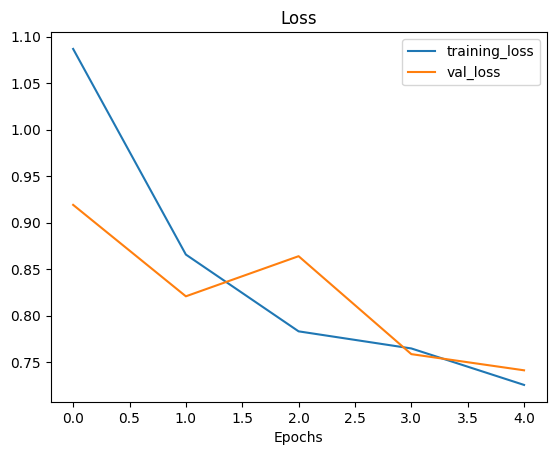

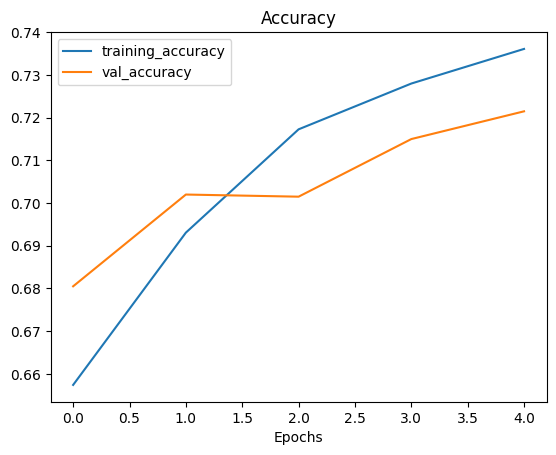

In [82]:
history_b1_aug= train_model(model_b01_aug, train_data_aug, experiment_name="efficientnetB01_aug", EPOCHS=5)
plot_loss_curves(history_b1_aug)

In [83]:
unfreeze(model_b01_aug, num_layers=10)

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 300, 400, 3)]     0         
                                                                 
 efficientnetb1 (Functional  (None, None, None, 1280   6575239   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 7)                 8967      
                                                                 
Total params: 6584206 (25.12 MB)
Trainable params: 1345367 (5.13 MB)
Non-trainable params: 5238839 (19.98 MB)
_________________________________________________________________
None


Saving TensorBoard log files to: /content/drive/MyDrive/tensor board log/ham10000_effi/efficientnetB1_aug_finetune/20240518-125326
Epoch 5/10
251/251 [==============================] - 222s 829ms/step - loss: 0.7130 - accuracy: 0.7379 - val_loss: 0.6914 - val_accuracy: 0.7430 - lr: 1.0000e-04
Epoch 6/10
251/251 [==============================] - 208s 828ms/step - loss: 0.6584 - accuracy: 0.7600 - val_loss: 0.6830 - val_accuracy: 0.7340 - lr: 1.0000e-04
Epoch 7/10
251/251 [==============================] - 204s 814ms/step - loss: 0.6414 - accuracy: 0.7629 - val_loss: 0.6477 - val_accuracy: 0.7605 - lr: 1.0000e-04
Epoch 8/10
251/251 [==============================] - 204s 814ms/step - loss: 0.6048 - accuracy: 0.7742 - val_loss: 0.7049 - val_accuracy: 0.7270 - lr: 1.0000e-04
Epoch 9/10
251/251 [==============================] - ETA: 0s - loss: 0.6033 - accuracy: 0.7733
Epoch 9: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
251/251 [==============================] - 20

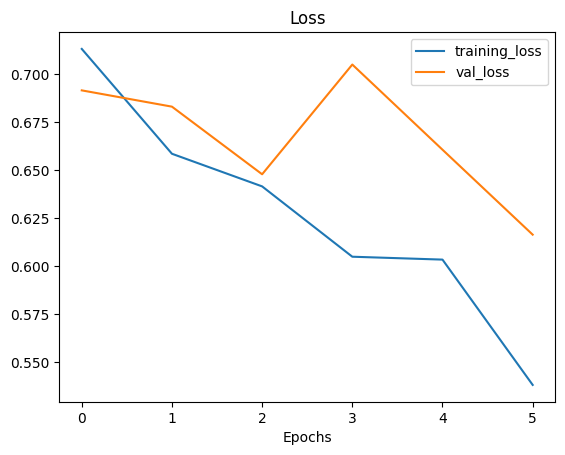

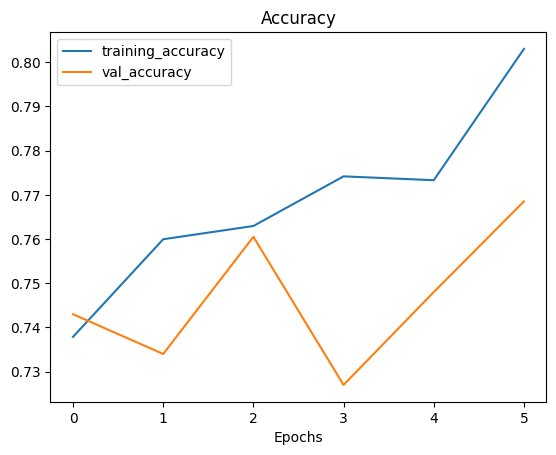

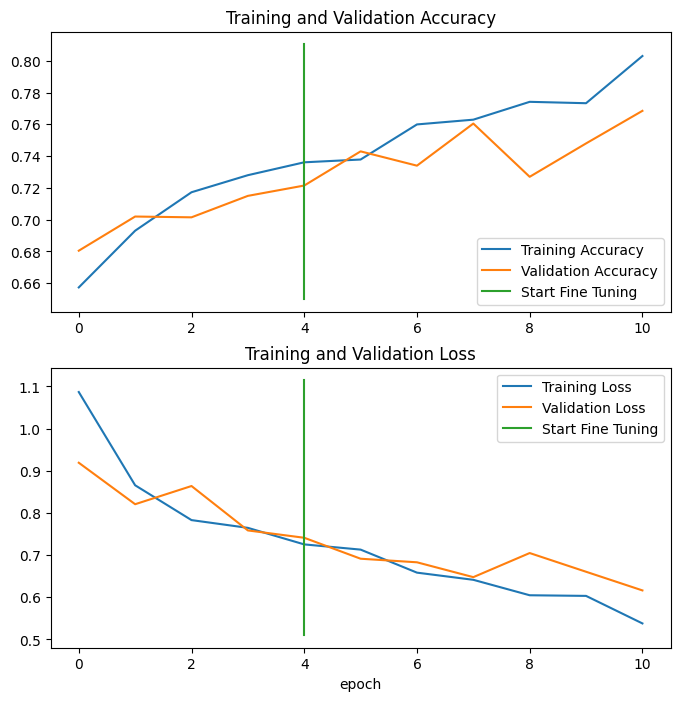

In [84]:
history_b1_aug_finetune= train_model(model_b01_aug, train_data_aug, experiment_name="efficientnetB1_aug_finetune", EPOCHS=5, fine_tune=True)
plot_loss_curves(history_b1_aug_finetune)
compare_historys(history_b1_aug,
                 history_b1_aug_finetune,
                 initial_epochs=5)

In [85]:
transfer_model= 'EfficientNetB2'
exec('base_model = tf.keras.applications.'+transfer_model+'(include_top=False)')
base_model.trainable = False
model_b2= create_model(img_shape=(300,400), num_class=7)

31790344/31790344 [==============================] - 0s 0us/step
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 300, 400, 3)]     0         
                                                                 
 efficientnetb2 (Functional  (None, None, None, 1408   7768569   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1408)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 7)                 9863      
                                                                 
Total params: 7778432 (29.67 MB)
Trainable params: 9863 (38.53 KB)
Non-trainable params: 7768569 (29.63 MB)
__________________

Saving TensorBoard log files to: /content/drive/MyDrive/tensor board log/ham10000_effi/efficientnetB2/20240518-132205
Epoch 1/5
251/251 [==============================] - 137s 495ms/step - loss: 1.0538 - accuracy: 0.6508 - val_loss: 0.8330 - val_accuracy: 0.7015 - lr: 0.0010
Epoch 2/5
251/251 [==============================] - 102s 407ms/step - loss: 0.8119 - accuracy: 0.7148 - val_loss: 0.8172 - val_accuracy: 0.7030 - lr: 0.0010
Epoch 3/5
251/251 [==============================] - 102s 406ms/step - loss: 0.7569 - accuracy: 0.7236 - val_loss: 0.7172 - val_accuracy: 0.7430 - lr: 0.0010
Epoch 4/5
251/251 [==============================] - 103s 410ms/step - loss: 0.7158 - accuracy: 0.7347 - val_loss: 0.7916 - val_accuracy: 0.7460 - lr: 0.0010
Epoch 5/5
251/251 [==============================] - ETA: 0s - loss: 0.6961 - accuracy: 0.7437
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
251/251 [==============================] - 100s 397ms/step - loss: 0.6961 - ac

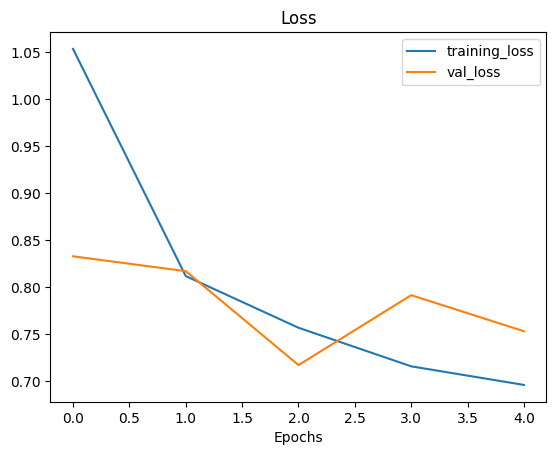

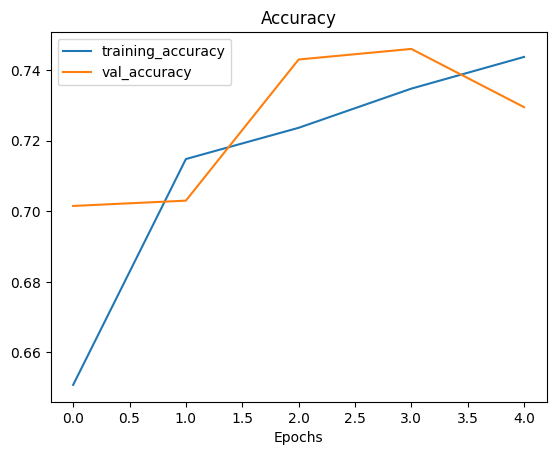

In [86]:
history_b2= train_model(model_b2, train_data, experiment_name="efficientnetB2", EPOCHS=5)
plot_loss_curves(history_b2)

In [87]:
unfreeze(model_b2, num_layers=10)

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 300, 400, 3)]     0         
                                                                 
 efficientnetb2 (Functional  (None, None, None, 1408   7768569   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1408)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 7)                 9863      
                                                                 
Total params: 7778432 (29.67 MB)
Trainable params: 1626335 (6.20 MB)
Non-trainable params: 6152097 (23.47 MB)
_________________________________________________________________
None


In [ ]:
history_b2_finetune= train_model(model_b2, train_data, experiment_name="efficientnetB2_finetune", EPOCHS=5, fine_tune=True)
plot_loss_curves(history_b2_finetune)
compare_historys(history_b2,
                 history_b2_finetune,
                 initial_epochs=5)

Saving TensorBoard log files to: /content/drive/MyDrive/tensor board log/ham10000_effi/efficientnetB2_finetune/20240518-133207
Epoch 5/10
251/251 [==============================] - 119s 413ms/step - loss: 0.6702 - accuracy: 0.7523 - val_loss: 0.6204 - val_accuracy: 0.7740 - lr: 1.0000e-04
Epoch 6/10
251/251 [==============================] - 123s 488ms/step - loss: 0.6312 - accuracy: 0.7652 - val_loss: 0.6699 - val_accuracy: 0.7560 - lr: 1.0000e-04
Epoch 7/10
251/251 [==============================] - ETA: 0s - loss: 0.5906 - accuracy: 0.7818
Epoch 7: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
251/251 [==============================] - 101s 401ms/step - loss: 0.5906 - accuracy: 0.7818 - val_loss: 0.6203 - val_accuracy: 0.7795 - lr: 1.0000e-04
Epoch 8/10
251/251 [==============================] - ETA: 0s - loss: 0.5121 - accuracy: 0.8183

#uploading the training logs to TensorBoard:

In [39]:
!tensorboard dev upload --logdir '/content/drive/MyDrive/tensor board log/ham10000_effi' \
  --name "ham10000_efficientnet" \
  --description "transfer learning using efficientnet models to classify skin cancer images" \
  --one_shot

2024-05-18 10:34:25.874222: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-18 10:34:25.874267: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-18 10:34:25.875903: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-18 10:34:26.969173: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
****************************************************************
****************************************************************
****************************************************************

Uploading TensorBoard logs to https://tensorb

# Making the best model:

first let's load the data using `tf.keras.utils.image_dataset_from_directory` module.



In [40]:
train_dir= '/content/ham10000/train'
test_dir= '/content/ham10000/test'

train_data= tf.keras.utils.image_dataset_from_directory(directory=train_dir,
                                                        labels='inferred',
                                                        label_mode='categorical' ,
                                                        class_names=class_names,
                                                        color_mode='rgb',
                                                        batch_size=32,
                                                        image_size=(450,600),
                                                        shuffle=True,
                                                        seed=32,
                                                        validation_split=None,
                                                        subset=None,
                                                        interpolation='bilinear',
                                                        follow_links=False,
                                                        crop_to_aspect_ratio=False)
test_data= tf.keras.utils.image_dataset_from_directory( directory=test_dir,
                                                        labels='inferred',
                                                        label_mode='categorical' ,
                                                        class_names=class_names,
                                                        color_mode='rgb',
                                                        batch_size=32,
                                                        image_size=(450,600),
                                                        shuffle=False,
                                                        seed=32,
                                                        validation_split=None,
                                                        subset=None,
                                                        interpolation='bilinear',
                                                        follow_links=False,
                                                        crop_to_aspect_ratio=False)

Found 8015 files belonging to 7 classes.
Found 2000 files belonging to 7 classes.


In [42]:
base_model = tf.keras.applications.EfficientNetB1(include_top=False)
base_model.trainable = False

# Setup model architecture with trainable top layers
inputs = layers.Input(shape=(450,600,3), name="input_layer") # shape of input image
x = inputs
x = base_model(x, training=False) # put the base model in inference mode so we can use it to extract features without updating the weights
x = layers.GlobalAveragePooling2D(name="global_average_pooling")(x) # pool the outputs of the base model
outputs = layers.Dense(7, activation="softmax", name="output_layer")(x) # same number of outputs as classes
model = tf.keras.Model(inputs, outputs)

model.compile(loss="categorical_crossentropy",
          optimizer=tf.keras.optimizers.Adam(), # use Adam with default settings
          metrics=["accuracy"])
print(model.summary())

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 450, 600, 3)]     0         
                                                                 
 efficientnetb1 (Functional  (None, None, None, 1280   6575239   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 7)                 8967      
                                                                 
Total params: 6584206 (25.12 MB)
Trainable params: 8967 (35.03 KB)
Non-trainable params: 6575239 (25.08 MB)
_________________________________________________________________
None


In [43]:
early_stop = EarlyStopping(monitor='val_loss', patience=2, verbose=1,
                        mode='auto')

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=1,
                          verbose=1, mode='auto')
# Create checkpoint callback to save model for later use
checkpoint_path = "golden_model"+ datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                        save_weights_only=True, # save only the model weights
                                                        monitor="val_accuracy", # save the model weights which score the best validation accuracy
                                                        save_best_only=True) # only keep the best model weights on file (delete the rest)

history = model.fit(train_data,
                    validation_data=test_data,
                    validation_steps= len(test_data),
                    epochs = 15,
                    callbacks = [reduce_lr,
                                early_stop,
                                create_tensorboard_callback(dir_name="/content/drive/MyDrive/tensor board log/ham10000_effi",experiment_name="golden_model"),
                                checkpoint_callback])

Saving TensorBoard log files to: /content/drive/MyDrive/tensor board log/ham10000_effi/golden_model/20240518-103539
Epoch 1/15
251/251 [==============================] - 168s 594ms/step - loss: 0.8628 - accuracy: 0.6932 - val_loss: 0.7596 - val_accuracy: 0.7260 - lr: 0.0010
Epoch 2/15
251/251 [==============================] - 154s 605ms/step - loss: 0.7087 - accuracy: 0.7384 - val_loss: 0.6827 - val_accuracy: 0.7490 - lr: 0.0010
Epoch 3/15
251/251 [==============================] - 140s 551ms/step - loss: 0.6480 - accuracy: 0.7614 - val_loss: 0.6526 - val_accuracy: 0.7625 - lr: 0.0010
Epoch 4/15
251/251 [==============================] - 141s 552ms/step - loss: 0.6094 - accuracy: 0.7747 - val_loss: 0.6259 - val_accuracy: 0.7720 - lr: 0.0010
Epoch 5/15
251/251 [==============================] - 139s 547ms/step - loss: 0.5826 - accuracy: 0.7842 - val_loss: 0.6124 - val_accuracy: 0.7720 - lr: 0.0010
Epoch 6/15
251/251 [==============================] - 139s 548ms/step - loss: 0.5574 - ac

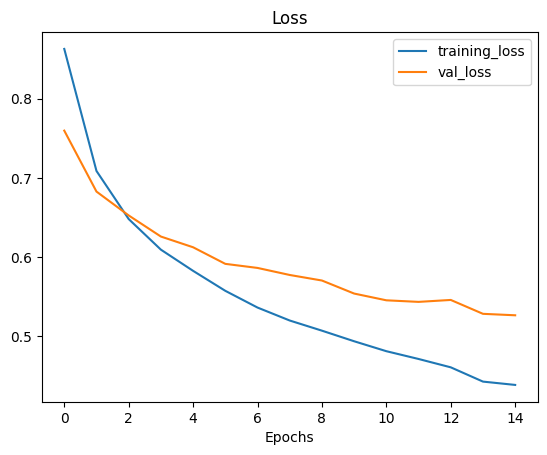

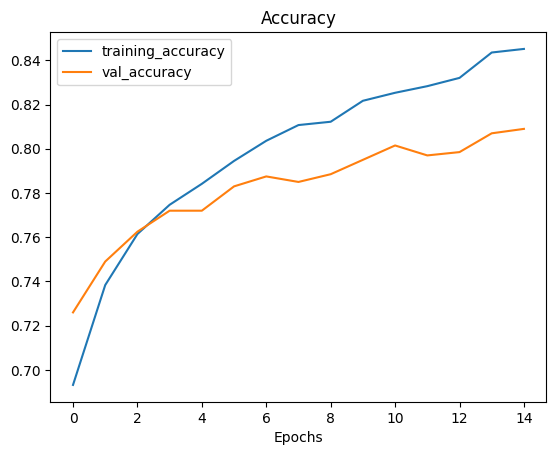

In [44]:
plot_loss_curves(history)

In [45]:
new_model= tf.keras.models.clone_model(model)
# Refreeze every layer except for the last 10
for layer in new_model.layers[1].layers: layer.trainable= False
for layer in new_model.layers[1].layers[-50:]: layer.trainable= True
new_model.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(learning_rate=.0001), # use Adam with default settings
              metrics=["accuracy"])
new_model.set_weights(model.get_weights())
new_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 450, 600, 3)]     0         
                                                                 
 efficientnetb1 (Functional  (None, None, None, 1280   6575239   
 )                           )                                   
                                                                 
 global_average_pooling (Gl  (None, 1280)              0         
 obalAveragePooling2D)                                           
                                                                 
 output_layer (Dense)        (None, 7)                 8967      
                                                                 
Total params: 6584206 (25.12 MB)
Trainable params: 3511479 (13.40 MB)
Non-trainable params: 3072727 (11.72 MB)
_________________________________________________________________


In [46]:
# This function keeps the initial learning rate for the first ten epochs
# and decreases it exponentially after that.
def scheduler(epoch, lr):
  if epoch < 15:
    return lr
  else:
    return lr * .1

In [47]:
history_finetune = new_model.fit(train_data,
                    validation_data=test_data,
                    validation_steps= len(test_data),
                    epochs = 18,
                    initial_epoch=14,
                    callbacks = [reduce_lr,
                                early_stop,
                                create_tensorboard_callback(dir_name="/content/drive/MyDrive/tensor board log/ham10000_effi",experiment_name="golden_model_finetune"),
                                checkpoint_callback,
                                tf.keras.callbacks.LearningRateScheduler(scheduler)])



Saving TensorBoard log files to: /content/drive/MyDrive/tensor board log/ham10000_effi/golden_model_finetune/20240518-113813
Epoch 15/18
251/251 [==============================] - 185s 653ms/step - loss: 0.4689 - accuracy: 0.8267 - val_loss: 0.4780 - val_accuracy: 0.8185 - lr: 1.0000e-04
Epoch 16/18
251/251 [==============================] - 162s 641ms/step - loss: 0.3011 - accuracy: 0.8979 - val_loss: 0.4286 - val_accuracy: 0.8415 - lr: 1.0000e-05
Epoch 17/18
251/251 [==============================] - 164s 647ms/step - loss: 0.2653 - accuracy: 0.9093 - val_loss: 0.4254 - val_accuracy: 0.8450 - lr: 1.0000e-06
Epoch 18/18
251/251 [==============================] - 161s 637ms/step - loss: 0.2610 - accuracy: 0.9098 - val_loss: 0.4249 - val_accuracy: 0.8445 - lr: 1.0000e-07


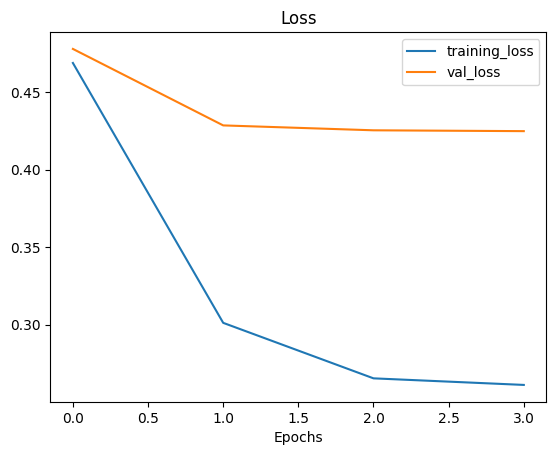

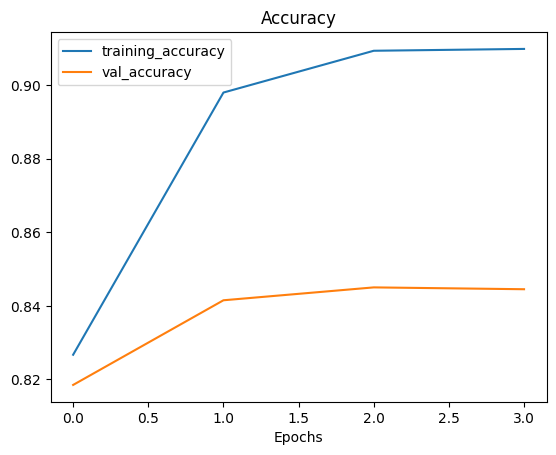

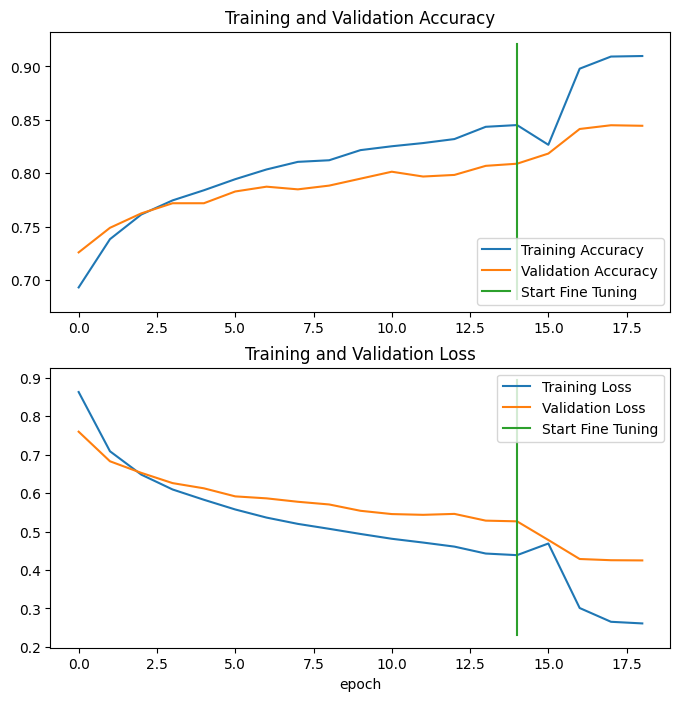

In [49]:
plot_loss_curves(history_finetune)
compare_historys(history,
                 history_finetune,
                 initial_epochs=15)

In [50]:
# Note: This might take a minute or so due to unravelling 790 batches
y_labels = []
for images, labels in test_data.unbatch(): # unbatch the test data and get images and labels
  y_labels.append(labels.numpy().argmax()) # append the index which has the largest value (labels are one-hot)
y_labels[:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [51]:
pred_classes= new_model.predict(test_data, verbose=1).argmax(axis=1).tolist()
pred_classes[:10]

63/63 [==============================] - 30s 452ms/step


[5, 4, 0, 1, 0, 0, 2, 0, 0, 2]

In [52]:
from sklearn.metrics import classification_report
print(classification_report(y_labels, pred_classes))
class_names

              precision    recall  f1-score   support

           0       0.67      0.55      0.61        65
           1       0.70      0.68      0.69       102
           2       0.73      0.63      0.68       219
           3       0.82      0.39      0.53        23
           4       0.64      0.56      0.60       222
           5       0.90      0.96      0.93      1341
           6       0.77      0.82      0.79        28

    accuracy                           0.84      2000
   macro avg       0.75      0.66      0.69      2000
weighted avg       0.84      0.84      0.84      2000



['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

In [53]:
# Note: This might take a minute or so due to unravelling 790 batches
y_labels = []
for images, labels in train_data.unbatch(): # unbatch the test data and get images and labels
  y_labels.append(labels.numpy().argmax()) # append the index which has the largest value (labels are one-hot)
y_labels[:10]

[5, 5, 5, 2, 5, 4, 4, 5, 5, 5]

In [54]:
pred_classes= new_model.predict(train_data, verbose=1).argmax(axis=1).tolist()
pred_classes[:10]

251/251 [==============================] - 114s 450ms/step


[5, 3, 5, 5, 6, 5, 4, 2, 3, 5]

In [55]:
from sklearn.metrics import classification_report
print(classification_report(y_labels, pred_classes))
class_names

              precision    recall  f1-score   support

           0       0.07      0.07      0.07       262
           1       0.05      0.05      0.05       412
           2       0.11      0.11      0.11       880
           3       0.01      0.01      0.01        92
           4       0.13      0.11      0.12       891
           5       0.68      0.70      0.69      5364
           6       0.03      0.03      0.03       114

    accuracy                           0.50      8015
   macro avg       0.15      0.15      0.15      8015
weighted avg       0.48      0.50      0.49      8015



['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

In [56]:
pred_probs= pred_classes= new_model.predict(train_data, verbose=0)
pred_probs=pred_probs.max(axis=1)
pred_probs[:10]

array([0.9991743 , 0.54557925, 0.9977792 , 0.99989057, 0.7314023 ,
       0.8635523 , 0.62159723, 0.9256119 , 0.7455457 , 0.8585489 ],
      dtype=float32)

In [57]:
pred_classes[:10]

array([[6.4780886e-07, 1.7708555e-05, 3.3153850e-04, 2.4411195e-06,
        4.6757882e-04, 9.9917430e-01, 5.7065135e-06],
       [3.4933868e-01, 5.4557925e-01, 8.4265418e-02, 1.4284804e-02,
        4.3029780e-03, 2.2002566e-03, 2.8549839e-05],
       [7.7965842e-06, 2.4682378e-05, 3.5165928e-04, 8.7227678e-04,
        9.1031339e-04, 9.9777919e-01, 5.4084143e-05],
       [1.6304429e-06, 3.3381960e-07, 3.1747630e-05, 1.1559277e-06,
        1.1170738e-05, 9.9989057e-01, 6.3322768e-05],
       [9.0789135e-06, 3.3382930e-06, 1.7938395e-03, 2.6338375e-06,
        2.6678854e-01, 7.3140228e-01, 2.5969769e-07],
       [1.9909015e-03, 1.2477543e-02, 8.6355227e-01, 1.0526858e-03,
        3.2611564e-02, 8.8298917e-02, 1.6030299e-05],
       [3.6218718e-03, 7.7147568e-05, 6.2159723e-01, 1.6775786e-05,
        1.7945258e-01, 1.9522144e-01, 1.3017423e-05],
       [4.5638619e-04, 2.1304456e-04, 1.7623836e-02, 2.6244193e-04,
        5.5798441e-02, 9.2561191e-01, 3.4007448e-05],
       [4.7219123e-04, 1

In [59]:
# Create a function to import an image and resize it to be able to be used with our model
def load_image(filename, img_shape=(450,600), scale=True):
  """
  Reads in an image from filename, turns it into a tensor and reshapes into
  (450, 600, 3).

  Parameters
  ----------
  filename (str): string filename of target image
  img_shape (int): size to resize target image to, default 224
  scale (bool): whether to scale pixel values to range(0, 1), default True
  """
  # Read in the image
  img = tf.io.read_file(filename)
  # Decode it into a tensor
  img = tf.image.decode_jpeg(img)
  # Resize the image
  if scale:
    # Rescale the image (get all values between 0 and 1)
    return img/255.
  else:
    return img


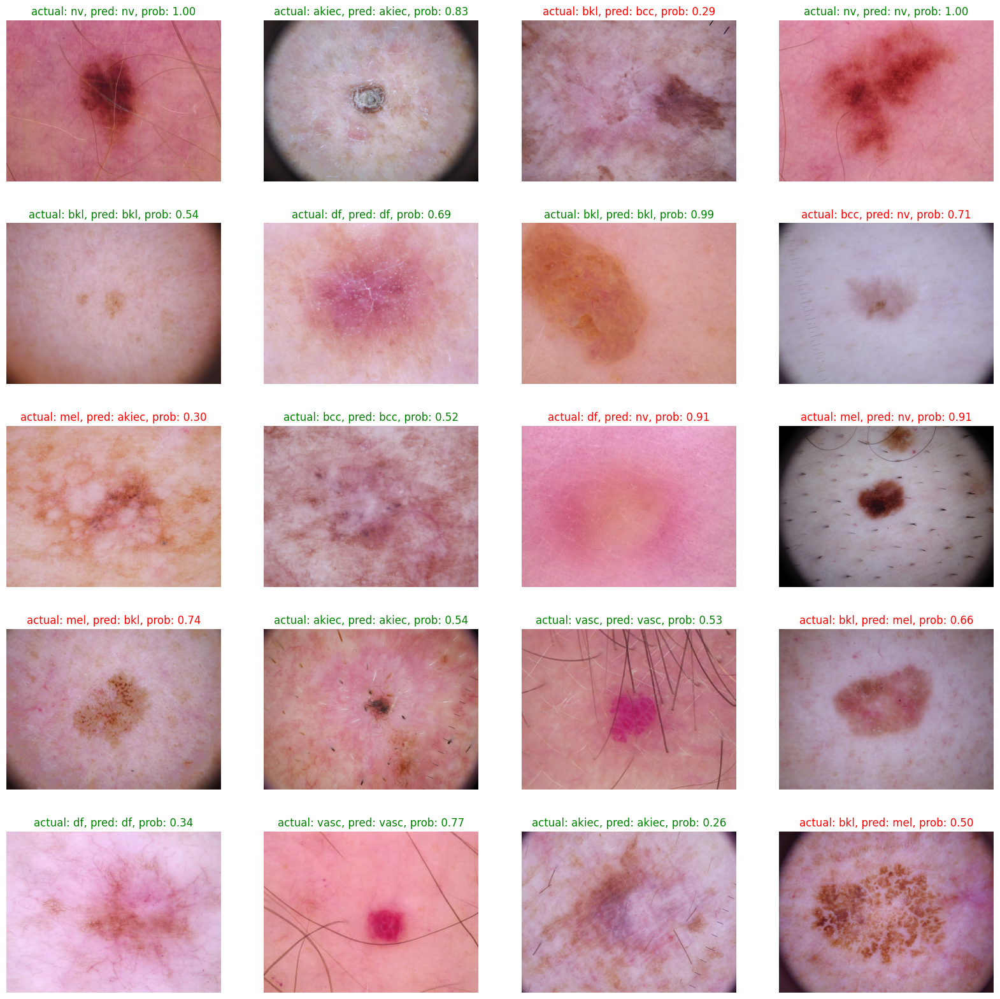

In [60]:
# Make preds on a series of random images
import os
import random
test_dir= '/content/ham10000/test'
plt.figure(figsize=(20, 20))
for i in range(20):
  # Choose a random image from a random class
  class_name = random.choice(class_names)
  filename = random.choice(os.listdir(test_dir + "/" + class_name))
  filepath = test_dir+'/' + class_name + "/" + filename

  # Load the image and make predictions
  img = load_image(filepath, scale=False) # don't scale images for EfficientNet predictions
  pred_prob = new_model.predict(tf.expand_dims(img, axis=0), verbose=0) # model accepts tensors of shape [None, 224, 224, 3]
  pred_class = class_names[pred_prob.argmax()] # find the predicted class

  # Plot the image(s)
  plt.subplot(5, 4, i+1)
  plt.imshow(img.numpy()/255.)
  if class_name == pred_class: # Change the color of text based on whether prediction is right or wrong
    title_color = "g"
  else:
    title_color = "r"
  plt.title(f"actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False);

In [61]:
# 1. Get the filenames of all of our test data
filepaths = []
for filepath in test_data.list_files(test_dir+"/*/*.jpg",
                                     shuffle=False):
  filepaths.append(filepath.numpy())
filepaths[:10]

[b'/content/ham10000/test/akiec/ISIC_0024418.jpg',
 b'/content/ham10000/test/akiec/ISIC_0024579.jpg',
 b'/content/ham10000/test/akiec/ISIC_0024654.jpg',
 b'/content/ham10000/test/akiec/ISIC_0024710.jpg',
 b'/content/ham10000/test/akiec/ISIC_0024771.jpg',
 b'/content/ham10000/test/akiec/ISIC_0024923.jpg',
 b'/content/ham10000/test/akiec/ISIC_0025196.jpg',
 b'/content/ham10000/test/akiec/ISIC_0025358.jpg',
 b'/content/ham10000/test/akiec/ISIC_0025427.jpg',
 b'/content/ham10000/test/akiec/ISIC_0025712.jpg']

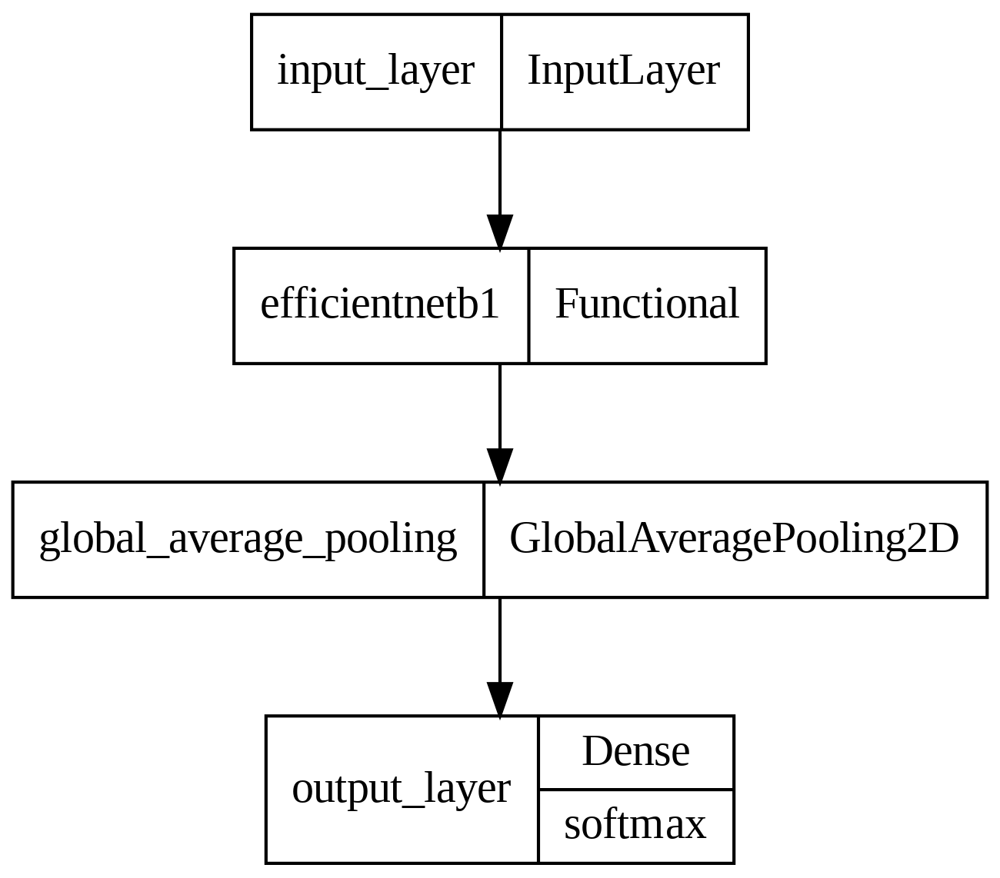

In [67]:
    dot_img_file = 'model_arch.png'
    tf.keras.utils.plot_model(model, to_file=dot_img_file,show_layer_activations=True, expand_nested=False, dpi=300)